In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
sb.set()

In [2]:
df = pd.read_csv(r"E:\Data Science\Compfest\used_car_data.csv")

In [3]:
import pandas_profiling
df.profile_report()

Render HTML: 100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


In [4]:
df

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price
0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,CNG,Manual,First,26.6 km/kg,998 CC,58.16 bhp,5.0,1.75
1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,Diesel,Manual,First,19.67 kmpl,1582 CC,126.2 bhp,5.0,12.50
2,Honda Jazz V,Chennai,2011,46000,Petrol,Manual,First,18.2 kmpl,1199 CC,88.7 bhp,5.0,4.50
3,Maruti Ertiga VDI,Chennai,2012,87000,Diesel,Manual,First,20.77 kmpl,1248 CC,88.76 bhp,7.0,6.00
4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,Diesel,Automatic,Second,15.2 kmpl,1968 CC,140.8 bhp,5.0,17.74
...,...,...,...,...,...,...,...,...,...,...,...,...
6014,Maruti Swift VDI,Delhi,2014,27365,Diesel,Manual,First,28.4 kmpl,1248 CC,74 bhp,5.0,4.75
6015,Hyundai Xcent 1.1 CRDi S,Jaipur,2015,100000,Diesel,Manual,First,24.4 kmpl,1120 CC,71 bhp,5.0,4.00
6016,Mahindra Xylo D4 BSIV,Jaipur,2012,55000,Diesel,Manual,Second,14.0 kmpl,2498 CC,112 bhp,8.0,2.90
6017,Maruti Wagon R VXI,Kolkata,2013,46000,Petrol,Manual,First,18.9 kmpl,998 CC,67.1 bhp,5.0,2.65


### Pertanyaan no 6

Total jarak pemakaian

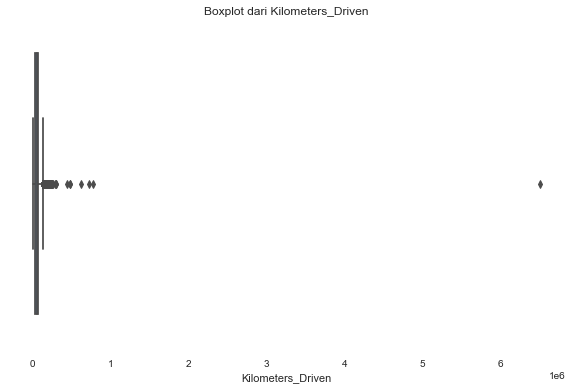

In [5]:
plt.figure(figsize=(10,6))
plt.title("Boxplot dari Kilometers_Driven")
sb.boxplot(df['Kilometers_Driven'])
plt.show()

Seperti terlihat pada boxplot, terdapat data yang sangat jauh dari distribusi data  pada umumnya sehingga data "Kilometer_Driven" tersebut memiliki outliers

In [6]:
kilometer=df['Kilometers_Driven']
kilometer=kilometer[kilometer<kilometer.quantile(0.99)]

In [48]:
from scipy.stats import spearmanr
cek=kilometer
spearmanr(df['Kilometers_Driven'],df["Price"])

SpearmanrResult(correlation=-0.21522078173958295, pvalue=5.138579313141823e-64)

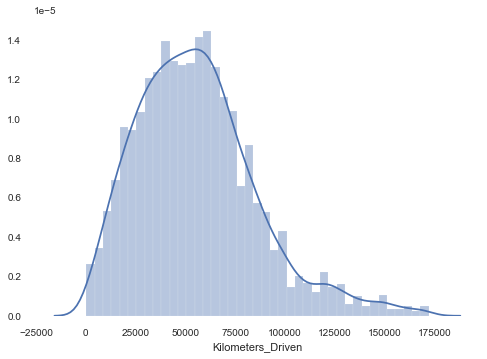

In [8]:
sb.distplot(kilometer)

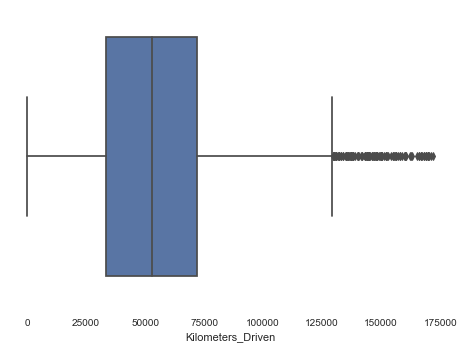

In [9]:
sb.boxplot(kilometer)

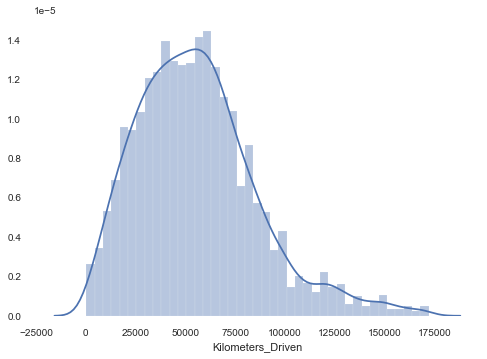

In [10]:
sb.distplot(kilometer)

### Pertanyaan no 5

In [11]:
batasBawah = df["Kilometers_Driven"].quantile(0.25)
batasAtas = df["Kilometers_Driven"].quantile(0.75)
print("Total jarak pemakaian dikategorikan rendah jika lebih kecil dari " + str(batasBawah) +"km")
print("Total jarak pemakaian dikategorikan tinggi jika lebih besar dari " + str(batasAtas) +"km")

Total jarak pemakaian dikategorikan rendah jika lebih kecil dari 34000.0km
Total jarak pemakaian dikategorikan tinggi jika lebih besar dari 73000.0km


### Pertanyaan no 7

Relation of year and kilometers driven

In [12]:
from scipy.stats import spearmanr
spearmanr(df[['Kilometers_Driven',"Year"]])

SpearmanrResult(correlation=-0.5531798387521031, pvalue=0.0)

### Pertanyaan no 8

owner

In [13]:
df['Owner_Type'].unique()

array(['First', 'Second', 'Fourth & Above', 'Third'], dtype=object)

In [14]:
value1 = df["Owner_Type"] == "Third"
value2 = df["Owner_Type"] == "Fourth & Above"
len(df[value1 | value2])

122

### Pertanyaan no 9

Bahan bakar dan Mileage

In [15]:
df[df["Fuel_Type"]=="Electric"][['Fuel_Type',"Mileage"]]

,Fuel_Type,Mileage
4446,Electric,NaN
4904,Electric,NaN


In [16]:
list(df["Fuel_Type"].unique())

['CNG', 'Diesel', 'Petrol', 'LPG', 'Electric']

In [17]:
import re
fuel_type=list(df["Fuel_Type"].unique())
#Menghilngkan electric
fuel_type.remove("Electric")
for fuel in fuel_type:
    mil_fuel=df[df["Fuel_Type"]==fuel]["Mileage"]
    #menghilangkan angka untuk mencari satuan
    print(f"Satuan {fuel} : " + mil_fuel.map(lambda x : "".join(re.findall("[^0-9.]",x))).unique())

['Satuan CNG :  km/kg']
['Satuan Diesel :  kmpl']
['Satuan Petrol :  kmpl']
['Satuan LPG :  km/kg']


In [18]:
def convertToInt(x):
    try:
        return float("".join(re.findall("[0-9.]",x)))
    except:
        print(x)
        return(x)

In [19]:
#faktor konversi
fuel = {"LPG":1.96,
        "CNG":1.5}
#Fungsi yang mengubah ke angka
def convert(x):
    return float("".join(re.findall("[0-9.]",x)))
for key in fuel.keys():
    copy_df = df[df["Fuel_Type"]==key]["Mileage"].copy()
    #mengubah kg ke liter
    df.loc[df["Fuel_Type"]==key,"Mileage"]=copy_df.map(lambda x : str(convert(x)/fuel[key]))
#mengubah seluruh nilai menjadi float, membiarkan nilai yang hilang
df["Mileage"]=df["Mileage"].map(lambda x : float("".join(re.findall("[0-9.]",x))),na_action='ignore')

In [20]:
df.groupby("Fuel_Type").describe()["Mileage"]

,count,mean,std,min,25%,50%,75%,max
Fuel_Type,,,,,,,,
CNG,56.0,16.945357,3.968970,8.800000,14.733333,17.733333,18.491667,22.360000
Diesel,3205.0,18.620484,4.962370,0.000000,14.840000,19.010000,22.690000,28.400000
Electric,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LPG,10.0,9.890306,2.724675,6.862245,7.353316,9.311224,12.716837,13.367347
Petrol,2746.0,17.415204,3.819760,0.000000,15.640000,17.800000,19.400000,26.000000


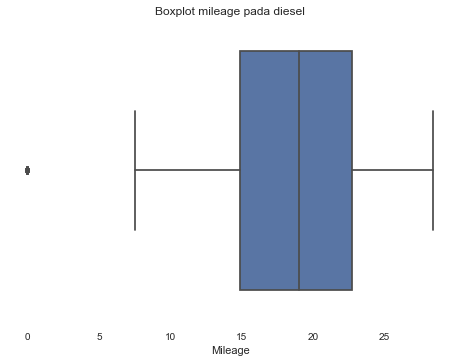

In [21]:
plt.figure()
plt.title("Boxplot mileage pada diesel")
toPlot = df[df["Fuel_Type"]=="Diesel"]["Mileage"]
sb.boxplot(toPlot)
plt.show()

In [22]:
df.groupby("Fuel_Type").median()[["Mileage"]].sort_values("Mileage")

,Mileage
Fuel_Type,
LPG,9.311224
CNG,17.733333
Petrol,17.800000
Diesel,19.010000
Electric,NaN


### No 10

convert to int

In [23]:
for col in ["Engine","Power"]:
    #mencari satuan
    satuan=str(df[col].map(lambda x : "".join(re.findall("[^0-9.]",x)), na_action="ignore").unique())
    print(f"Satuan {col} : " + satuan)

Satuan Engine : [' CC' nan]
Satuan Power : [' bhp' 'null bhp' nan]


In [24]:
def convertToInt(x):
    if x!="null bhp":
        return float("".join(re.findall("[0-9.]",x)))
    else:
        return np.nan
for column in ["Engine","Power"]:
    df[column]=df[column].map(convertToInt,na_action='ignore')

checking null value convert it to nan

In [25]:
df

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price
0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,CNG,Manual,First,17.733333,998.0,58.16,5.0,1.75
1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,Diesel,Manual,First,19.670000,1582.0,126.20,5.0,12.50
2,Honda Jazz V,Chennai,2011,46000,Petrol,Manual,First,18.200000,1199.0,88.70,5.0,4.50
3,Maruti Ertiga VDI,Chennai,2012,87000,Diesel,Manual,First,20.770000,1248.0,88.76,7.0,6.00
4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,Diesel,Automatic,Second,15.200000,1968.0,140.80,5.0,17.74
...,...,...,...,...,...,...,...,...,...,...,...,...
6014,Maruti Swift VDI,Delhi,2014,27365,Diesel,Manual,First,28.400000,1248.0,74.00,5.0,4.75
6015,Hyundai Xcent 1.1 CRDi S,Jaipur,2015,100000,Diesel,Manual,First,24.400000,1120.0,71.00,5.0,4.00
6016,Mahindra Xylo D4 BSIV,Jaipur,2012,55000,Diesel,Manual,Second,14.000000,2498.0,112.00,8.0,2.90
6017,Maruti Wagon R VXI,Kolkata,2013,46000,Petrol,Manual,First,18.900000,998.0,67.10,5.0,2.65


In [26]:
df["Name"]=df["Name"].map(lambda x : x.split(" ")[0].capitalize())

changing dummy

In [27]:
df["Name"]=df["Name"].map(lambda x : x.split(" ")[0].capitalize())
numCol=["Mileage","Engine","Power"]
for col in numCol:
    df[col]=df[col].astype("float64")
df_dummy=pd.get_dummies(df,drop_first=True)

In [28]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
def impute_missing(df):
    #Price tidak dimasukkan karena price merupakan variabel yang ingin diprediksi
    imputer=IterativeImputer().fit(df.drop(columns=['Price']))
    df_copy=df.copy()
    val = imputer.transform(df_copy.drop(columns=['Price']))
    df_hasil = pd.DataFrame(val,columns=df_copy.drop(columns=['Price']).columns)
    df_hasil['Price'] = df_copy['Price'].values
    return df_hasil
df_hasil=impute_missing(df_dummy)
from sklearn.preprocessing import power_transform
cols=["Year","Kilometers_Driven","Mileage","Engine","Power","Seats","Price"]
df_hasil[cols]=power_transform(df_hasil[cols],method="yeo-johnson")

violin plot

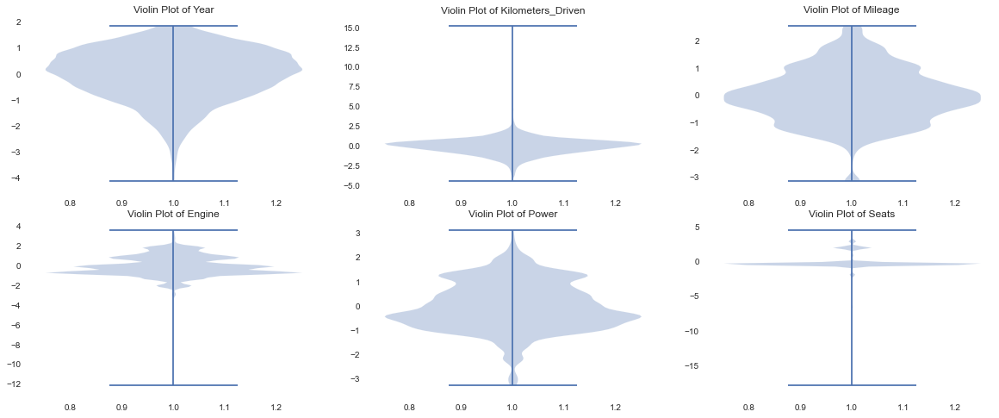

In [29]:
ax={}
fig,((ax[0],ax[1],ax[2]),(ax[3],ax[4],ax[5])) = plt.subplots(2, 3, figsize=(20,8))
fig.figsize=(20,8)
for k,col in enumerate(["Year",'Kilometers_Driven', 'Mileage', 'Engine', 'Power', 'Seats']):
    ax[k].set_title(f"Violin Plot of {col}")
    ax[k].violinplot(df_hasil[col])
plt.show()

scatter plot

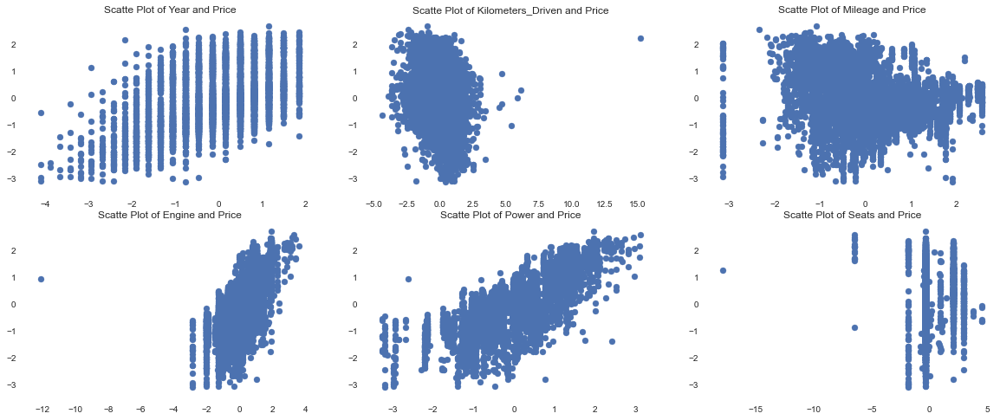

In [30]:
ax={}
fig,((ax[0],ax[1],ax[2]),(ax[3],ax[4],ax[5])) = plt.subplots(2, 3, figsize=(20,8))
fig.figsize=(20,8)
for k,col in enumerate(["Year",'Kilometers_Driven', 'Mileage', 'Engine', 'Power', 'Seats']):
    ax[k].set_title(f"Scatte Plot of {col} and Price")
    ax[k].scatter(df_hasil[col],df_hasil["Price"])
plt.show()

In [31]:
spearmanr(df_hasil["Seats"],df_hasil["Price"])

SpearmanrResult(correlation=0.21108270543133828, pvalue=1.3609047130004293e-61)

In [32]:
df_out=df_hasil.copy()
for col in ["Engine","Seats"]:
    tresh=df_hasil[col].quantile(0.001)
    df_out.loc[df_out[col]<tresh,col]=tresh
tresh=df_hasil["Kilometers_Driven"].quantile(0.999)
df_out.loc[df_out["Kilometers_Driven"]>tresh,"Kilometers_Driven"]=tresh
tresh=df_hasil["Mileage"].quantile(0.01)
df_out.loc[df_out["Mileage"]<tresh,"Mileage"]=tresh

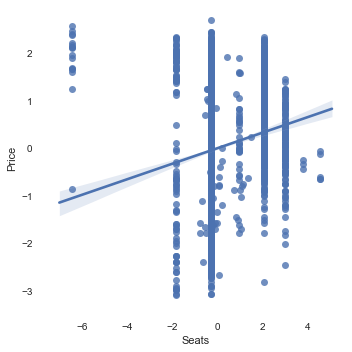

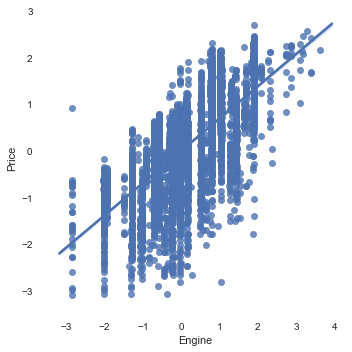

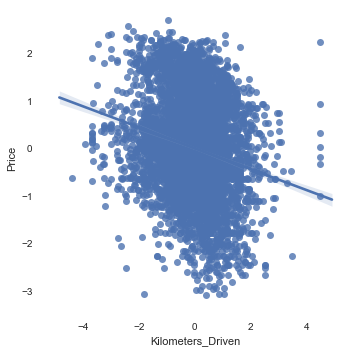

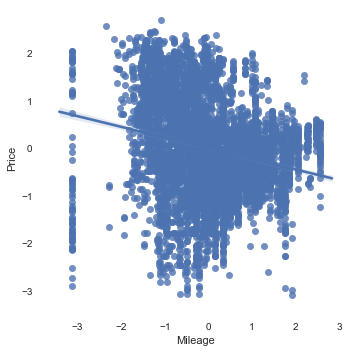

In [33]:
sb.lmplot(data=df_out,x="Seats",y="Price")
sb.lmplot(data=df_out,x="Engine",y="Price")
sb.lmplot(data=df_out,x="Kilometers_Driven",y="Price")
sb.lmplot(data=df_out,x="Mileage",y="Price")
plt.show()

In [34]:
import statsmodels.api as sm
X=df_out.drop(columns="Price")
y=df_out["Price"]
model=sm.OLS(y,X)
result=model.fit()
results_as_html = result.summary().tables[1].as_html()
coef_importance=pd.read_html(results_as_html, header=0, index_col=0)[0]

In [35]:
result.summary().tables[2]

Omnibus:,1745.296,Durbin-Watson:,1.962
Prob(Omnibus):,0.000,Jarque-Bera (JB):,30230.406
Skew:,-0.932,Prob(JB):,0.00
Kurtosis:,13.820,Cond. No.,143.


In [36]:
result.summary().tables[0]

Dep. Variable:,Price,R-squared (uncentered):,0.928
Model:,OLS,Adj. R-squared (uncentered):,0.927
Method:,Least Squares,F-statistic:,1443.
Date:,"Thu, 06 Aug 2020",Prob (F-statistic):,0.00
Time:,22:35:13,Log-Likelihood:,-636.55
No. Observations:,6019,AIC:,1379.
Df Residuals:,5966,BIC:,1734.
Df Model:,53,,
Covariance Type:,nonrobust,,


In [37]:
coef_importance[coef_importance['P>|t|']<=0.05].index

Index(['Year', 'Kilometers_Driven', 'Mileage', 'Engine', 'Power', 'Seats',
       'Name_Audi', 'Name_Bentley', 'Name_Bmw', 'Name_Chevrolet',
       'Name_Datsun', 'Name_Fiat', 'Name_Ford', 'Name_Honda', 'Name_Hyundai',
       'Name_Isuzu', 'Name_Jaguar', 'Name_Lamborghini', 'Name_Land',
       'Name_Mahindra', 'Name_Mercedes-benz', 'Name_Mini', 'Name_Mitsubishi',
       'Name_Nissan', 'Name_Porsche', 'Name_Tata', 'Name_Toyota',
       'Name_Volkswagen', 'Name_Volvo', 'Location_Bangalore',
       'Location_Coimbatore', 'Location_Delhi', 'Location_Hyderabad',
       'Location_Jaipur', 'Location_Kochi', 'Location_Kolkata',
       'Location_Mumbai', 'Location_Pune', 'Fuel_Type_Diesel',
       'Fuel_Type_Electric', 'Transmission_Manual', 'Owner_Type_Second',
       'Owner_Type_Third'],
      dtype='object')

In [38]:
coef_importance[coef_importance['P>|t|']>0.05].index

Index(['Name_Force', 'Name_Jeep', 'Name_Maruti', 'Name_Renault', 'Name_Skoda',
       'Name_Smart', 'Location_Chennai', 'Fuel_Type_LPG', 'Fuel_Type_Petrol',
       'Owner_Type_Fourth & Above'],
      dtype='object')

In [39]:
df

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Price
0,Maruti,Mumbai,2010,72000,CNG,Manual,First,17.733333,998.0,58.16,5.0,1.75
1,Hyundai,Pune,2015,41000,Diesel,Manual,First,19.670000,1582.0,126.20,5.0,12.50
2,Honda,Chennai,2011,46000,Petrol,Manual,First,18.200000,1199.0,88.70,5.0,4.50
3,Maruti,Chennai,2012,87000,Diesel,Manual,First,20.770000,1248.0,88.76,7.0,6.00
4,Audi,Coimbatore,2013,40670,Diesel,Automatic,Second,15.200000,1968.0,140.80,5.0,17.74
...,...,...,...,...,...,...,...,...,...,...,...,...
6014,Maruti,Delhi,2014,27365,Diesel,Manual,First,28.400000,1248.0,74.00,5.0,4.75
6015,Hyundai,Jaipur,2015,100000,Diesel,Manual,First,24.400000,1120.0,71.00,5.0,4.00
6016,Mahindra,Jaipur,2012,55000,Diesel,Manual,Second,14.000000,2498.0,112.00,8.0,2.90
6017,Maruti,Kolkata,2013,46000,Petrol,Manual,First,18.900000,998.0,67.10,5.0,2.65


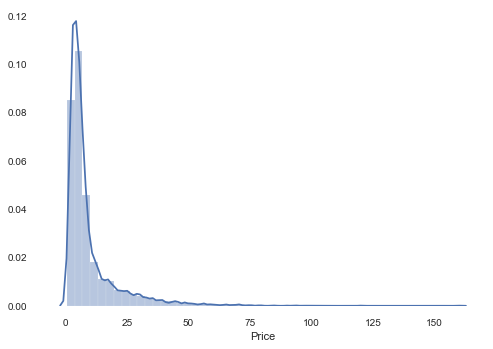

In [40]:
sb.distplot(df["Price"])

In [41]:
df_hasil

,Year,Kilometers_Driven,Mileage,Engine,Power,Seats,Name_Audi,Name_Bentley,Name_Bmw,Name_Chevrolet,...,Location_Pune,Fuel_Type_Diesel,Fuel_Type_Electric,Fuel_Type_LPG,Fuel_Type_Petrol,Transmission_Manual,Owner_Type_Fourth & Above,Owner_Type_Second,Owner_Type_Third,Price
0,-1.053505,0.574799,-0.121158,-1.279782,-1.480329,-0.308102,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,-1.584617
1,0.488159,-0.297100,0.328801,0.135312,0.562357,-0.308102,0.0,0.0,0.0,0.0,...,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.879949
2,-0.759078,-0.129507,-0.014328,-0.701555,-0.292849,-0.308102,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,-0.327555
3,-0.457852,0.898776,0.591933,-0.577941,-0.291096,2.047880,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.038021
4,-0.149676,-0.308677,-0.682559,0.764625,0.805009,-0.308102,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.228237
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6014,0.165607,-0.846442,2.554211,-0.577941,-0.779443,-0.308102,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.257639
6015,0.488159,1.147955,1.496781,-0.914039,-0.895371,-0.308102,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,-0.481487
6016,-0.457852,0.141261,-0.937005,1.423300,0.285766,2.979993,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,-0.909868
6017,-0.149676,-0.129507,0.147830,-1.279782,-1.056592,-0.308102,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,-1.031057


In [42]:
df[df["Owner_Type"]!="First"]["Year"]

4       2013
9       2012
14      2012
21      2015
27      2013
        ... 
5994    2009
5998    2010
6000    2014
6008    2013
6016    2012
Name: Year, Length: 1090, dtype: int64

In [43]:
from scipy.stats import shapiro
year_bekas=df[df["Owner_Type"]!="First"]["Year"].values
w,pvalue=shapiro(year_bekas)
print(w,pvalue)

0.9736291170120239 3.448004414537825e-13


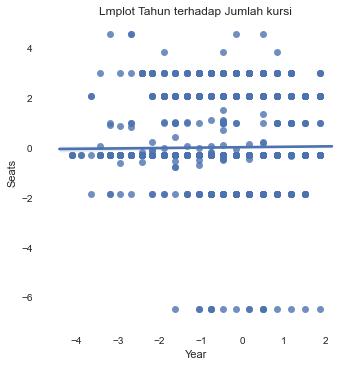

In [44]:
ax = sb.lmplot(data=df_out,x="Year",y="Seats").set(title="Lmplot Tahun terhadap Jumlah kursi")
plt.show()

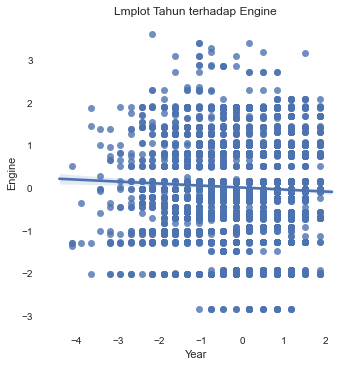

In [45]:
ax = sb.lmplot(data=df_out,x="Year",y="Engine").set(title="Lmplot Tahun terhadap Engine")
plt.show()

In [46]:
import statsmodels.api as sm
X=df_out["Year"]
y=df_out["Engine"]
model=sm.OLS(y,X)
result=model.fit()
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                 Engine   R-squared (uncentered):                   0.002
Model:                            OLS   Adj. R-squared (uncentered):              0.002
Method:                 Least Squares   F-statistic:                              13.54
Date:                Thu, 06 Aug 2020   Prob (F-statistic):                    0.000235
Time:                        22:35:19   Log-Likelihood:                         -8463.7
No. Observations:                6019   AIC:                                  1.693e+04
Df Residuals:                    6018   BIC:                                  1.694e+04
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Year          -0.0468      0.013     -3.680      0.000      -0.072      -0.022
==============================================================================
Omnibus:                       57.895   Durbin-Watson:                   2.014
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               59.083
Skew:                           0.237   Prob(JB):                     1.48e-13
Kurtosis:                       2.893   Cond. No.                         1.00
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [47]:
import statsmodels.api as sm
X=df["Year"]
y=df["Kilometers_Driven"]
model=sm.OLS(y,X)
result=model.fit()
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:      Kilometers_Driven   R-squared (uncentered):                   0.293
Model:                            OLS   Adj. R-squared (uncentered):              0.293
Method:                 Least Squares   F-statistic:                              2490.
Date:                Thu, 06 Aug 2020   Prob (F-statistic):                        0.00
Time:                        22:35:19   Log-Likelihood:                         -77288.
No. Observations:                6019   AIC:                                  1.546e+05
Df Residuals:                    6018   BIC:                                  1.546e+05
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Year          29.1615      0.584     49.899      0.000      28.016      30.307
==============================================================================
Omnibus:                    20122.748   Durbin-Watson:                   1.993
Prob(Omnibus):                  0.000   Jarque-Bera (JB):       4257198481.649
Skew:                          58.675   Prob(JB):                         0.00
Kurtosis:                    4121.406   Cond. No.                         1.00
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Decision Tree

In [55]:
index=np.arange(len(df_out))
np.random.shuffle(index)
train_index=index[:-(len(df)//5)]
test_index=index[-(len(df)//5):]

In [60]:
X=df_out.drop(columns="Price")
y=df_out["Price"]
X_train,X_test=X.loc[train_index,:],X.loc[test_index,:]
y_train,y_test=y[train_index],y[test_index]

In [62]:
from sklearn.tree import DecisionTreeRegressor
dt=DecisionTreeRegressor()
path = dt.cost_complexity_pruning_path(X_train,y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

In [63]:
clfs = [0 for i in ccp_alphas]
for k in range(len(ccp_alphas)):
    clf = DecisionTreeRegressor(random_state=0, ccp_alpha=ccp_alphas[k])
    clf.fit(X_train,y_train)
    clfs[k]=(clf)

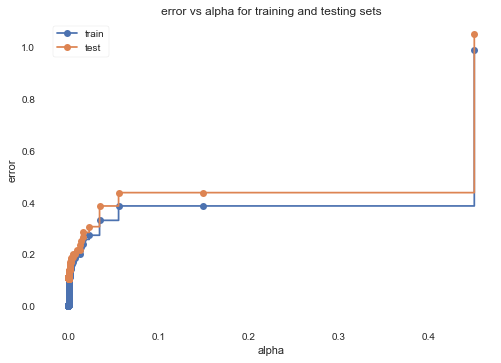

In [64]:
from sklearn.metrics import mean_squared_error
train_scores = [mean_squared_error(clf.predict(X_train),y_train) for clf in clfs]
test_scores = [mean_squared_error(clf.predict(X_test),y_test) for clf in clfs]

fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("error")
ax.set_title("error vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_scores, marker='o', label="train",
        drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker='o', label="test",
        drawstyle="steps-post")
ax.legend()
plt.show()

In [65]:
ccp_alphas

array([0.00000000e+00, 4.96761189e-11, 5.43773793e-11, ...,
       5.56011446e-02, 1.49851772e-01, 4.50501507e-01])

In [72]:
dt=DecisionTreeRegressor(ccp_alpha=0).fit(X_train,y_train)
from sklearn.tree import *
dotfile = open("tree.dot", 'w')
export_graphviz(dt, out_file=dotfile, feature_names=list(df_out.iloc[:,:-1].columns))
dotfile.close()

In [70]:
from sklearn.metrics import mean_absolute_error
mean_absolute_error(dt.predict(X_test),y_test)

0.2312666827301903